# Welcome to Breast-Cancer Prediction ML Model

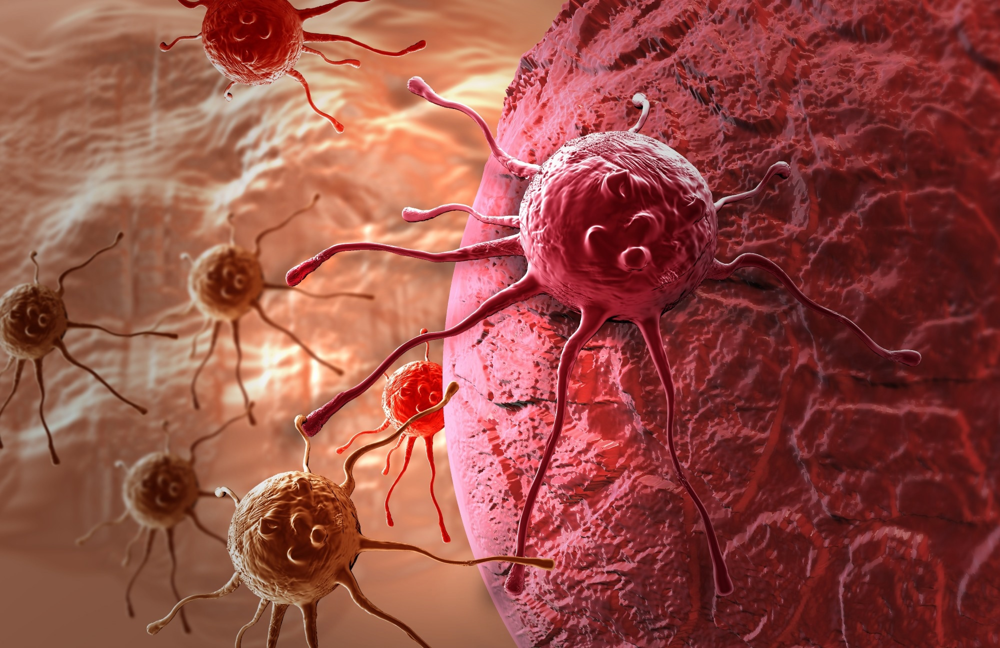

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns
from sklearn.metrics import recall_score, precision_score, f1_score, classification_report,confusion_matrix, accuracy_score
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
plt.style.use('seaborn-v0_8')

import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None)

# Reading the Dataset and Doing Initial Analysis

In [ ]:
data = pd.read_csv('Cancer_Data.csv')
df = pd.DataFrame(data)
df

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744,0.4956,1.1560,3.445,27.23,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,926424,M,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,0.05623,1.1760,1.2560,7.673,158.70,0.010300,0.02891,0.05198,0.02454,0.01114,0.004239,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,926682,M,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,0.05533,0.7655,2.4630,5.203,99.04,0.005769,0.02423,0.03950,0.01678,0.01898,0.002498,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,926954,M,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,0.05648,0.4564,1.0750,3.425,48.55,0.005903,0.03731,0.04730,0.01557,0.01318,0.003892,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,927241,M,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,0.07016,0.7260,1.5950,5.772,86.22,0.006522,0.06158,0.07117,0.01664,0.02324,0.006185,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


In [ ]:
df = df.drop(columns = ['id'])
df

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744,0.4956,1.1560,3.445,27.23,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,M,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,0.05623,1.1760,1.2560,7.673,158.70,0.010300,0.02891,0.05198,0.02454,0.01114,0.004239,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,M,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,0.05533,0.7655,2.4630,5.203,99.04,0.005769,0.02423,0.03950,0.01678,0.01898,0.002498,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,M,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,0.05648,0.4564,1.0750,3.425,48.55,0.005903,0.03731,0.04730,0.01557,0.01318,0.003892,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,M,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,0.07016,0.7260,1.5950,5.772,86.22,0.006522,0.06158,0.07117,0.01664,0.02324,0.006185,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   diagnosis                569 non-null    object 
 1   radius_mean              569 non-null    float64
 2   texture_mean             569 non-null    float64
 3   perimeter_mean           569 non-null    float64
 4   area_mean                569 non-null    float64
 5   smoothness_mean          569 non-null    float64
 6   compactness_mean         569 non-null    float64
 7   concavity_mean           569 non-null    float64
 8   concave points_mean      569 non-null    float64
 9   symmetry_mean            569 non-null    float64
 10  fractal_dimension_mean   569 non-null    float64
 11  radius_se                569 non-null    float64
 12  texture_se               569 non-null    float64
 13  perimeter_se             569 non-null    float64
 14  area_se                  5

In [ ]:
 # look at null values
df.isnull().sum()

diagnosis                  0
radius_mean                0
texture_mean               0
perimeter_mean             0
area_mean                  0
smoothness_mean            0
compactness_mean           0
concavity_mean             0
concave points_mean        0
symmetry_mean              0
fractal_dimension_mean     0
radius_se                  0
texture_se                 0
perimeter_se               0
area_se                    0
smoothness_se              0
compactness_se             0
concavity_se               0
concave points_se          0
symmetry_se                0
fractal_dimension_se       0
radius_worst               0
texture_worst              0
perimeter_worst            0
area_worst                 0
smoothness_worst           0
compactness_worst          0
concavity_worst            0
concave points_worst       0
symmetry_worst             0
fractal_dimension_worst    0
dtype: int64

In [ ]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
radius_mean,569.0,14.127292,3.524049,6.981000,11.700000,13.370000,15.780000,28.11000
texture_mean,569.0,19.289649,4.301036,9.710000,16.170000,18.840000,21.800000,39.28000
perimeter_mean,569.0,91.969033,24.298981,43.790000,75.170000,86.240000,104.100000,188.50000
area_mean,569.0,654.889104,351.914129,143.500000,420.300000,551.100000,782.700000,2501.00000
smoothness_mean,569.0,0.096360,0.014064,0.052630,0.086370,0.095870,0.105300,0.16340
compactness_mean,569.0,0.104341,0.052813,0.019380,0.064920,0.092630,0.130400,0.34540
concavity_mean,569.0,0.088799,0.079720,0.000000,0.029560,0.061540,0.130700,0.42680
concave points_mean,569.0,0.048919,0.038803,0.000000,0.020310,0.033500,0.074000,0.20120
symmetry_mean,569.0,0.181162,0.027414,0.106000,0.161900,0.179200,0.195700,0.30400
fractal_dimension_mean,569.0,0.062798,0.007060,0.049960,0.057700,0.061540,0.066120,0.09744


In [ ]:
 # look at null values
df.isnull().sum()

diagnosis                  0
radius_mean                0
texture_mean               0
perimeter_mean             0
area_mean                  0
smoothness_mean            0
compactness_mean           0
concavity_mean             0
concave points_mean        0
symmetry_mean              0
fractal_dimension_mean     0
radius_se                  0
texture_se                 0
perimeter_se               0
area_se                    0
smoothness_se              0
compactness_se             0
concavity_se               0
concave points_se          0
symmetry_se                0
fractal_dimension_se       0
radius_worst               0
texture_worst              0
perimeter_worst            0
area_worst                 0
smoothness_worst           0
compactness_worst          0
concavity_worst            0
concave points_worst       0
symmetry_worst             0
fractal_dimension_worst    0
dtype: int64

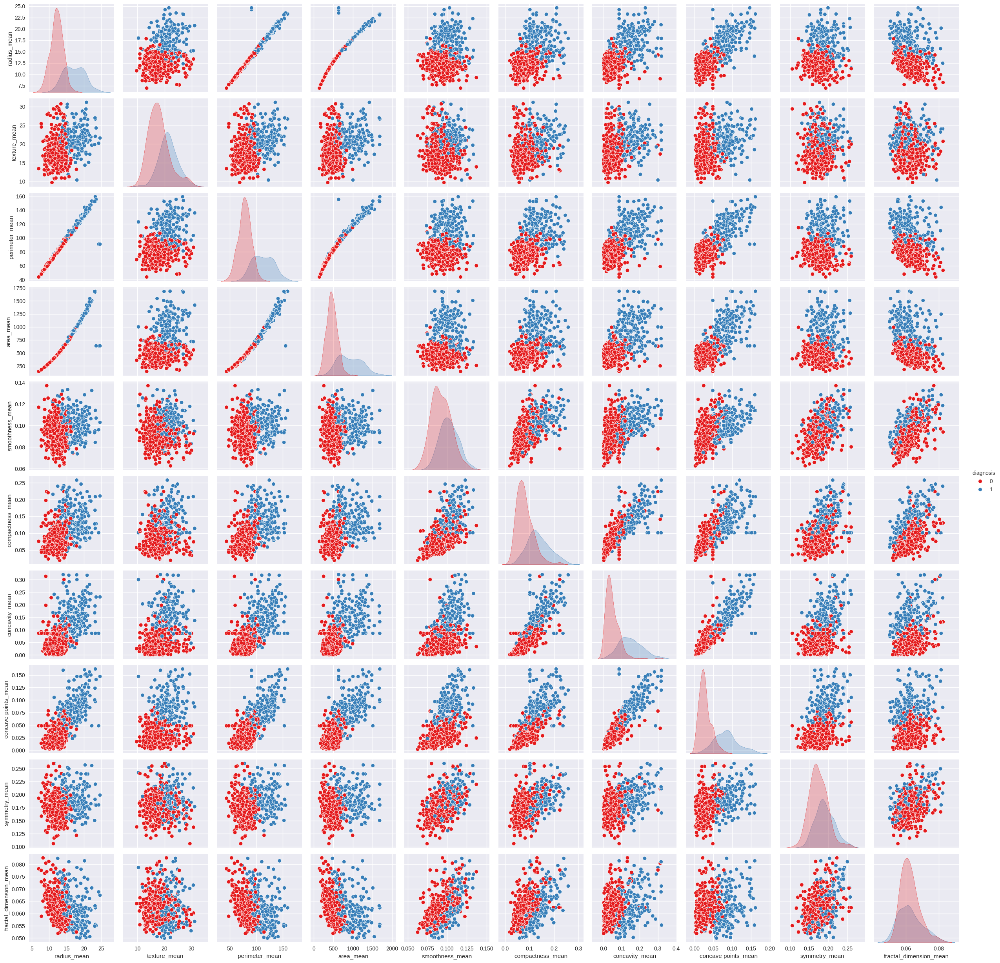

In [ ]:
# Pairplot
sns.pairplot(data = df.iloc[:, 0:11], hue="diagnosis", palette="Set1")
plt.show()

It seems that:




There are strong correlations between many variables. Next, a heatmap will be used to present the numerical correlations.




The univariate distributions on the diagonal show a separation of malignant and benign cells for several mean features. Malignant cells tend to have larger mean values of:




>radius

>perimeter

>area

>compactness

>concavity

>concave points

> **Dividing the dataset into 3 datasets for easier analysis**

In [ ]:
df_viz1 = df.iloc[:,1:11]
df_viz2 = df.iloc[:,11:21]
df_viz3 = df.iloc[:,21:-1]
df_viz1['diagnosis'] = df.diagnosis
df_viz2['diagnosis'] = df.diagnosis
df_viz3['diagnosis'] = df.diagnosis

# Analyis on the first part

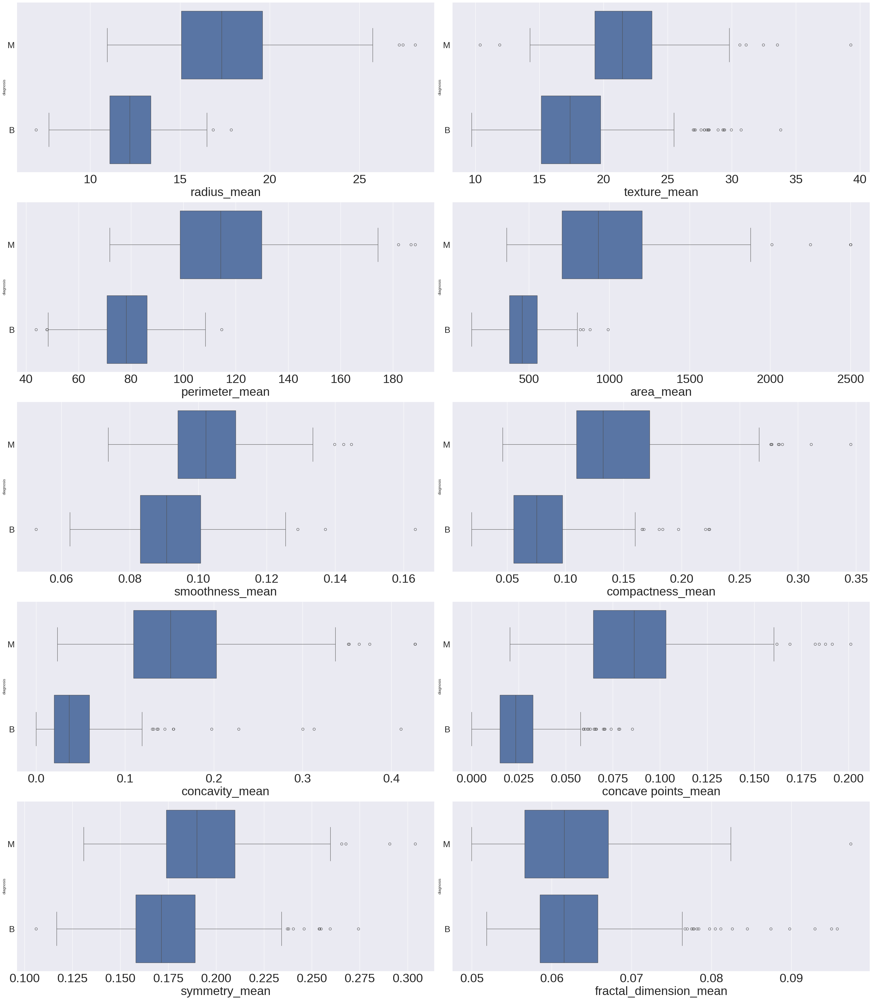

In [ ]:
fig,axs = plt.subplots(ncols =2 ,nrows =5 ,figsize = (35,40),dpi= 100)
axs = axs.flatten()
for i,col in enumerate(df_viz1.drop(columns = 'diagnosis').columns) :
    sns.boxplot(x = col,y='diagnosis',data = df_viz1 , ax=axs[i])
    axs[i].set_xlabel(col,fontsize=35)
    axs[i].tick_params(axis= 'x',labelsize = 35)
    axs[i].tick_params(axis= 'y',labelsize = 25)

plt.tight_layout()
plt.show()

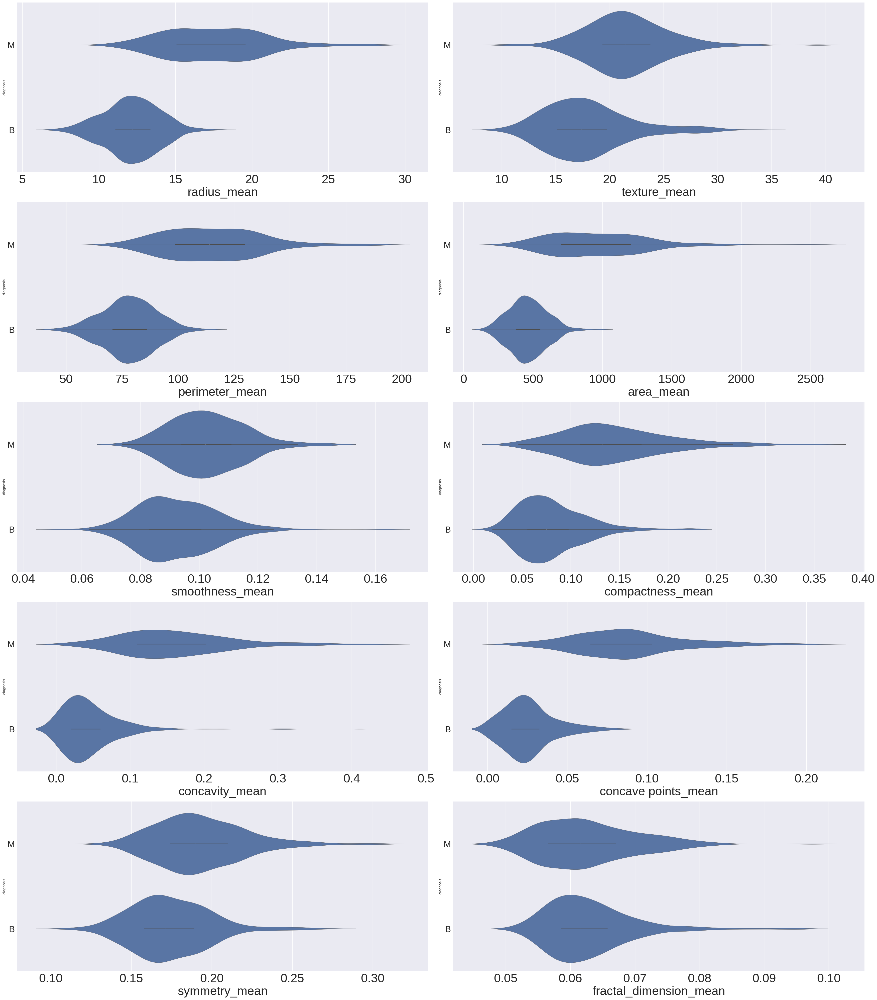

In [ ]:
fig,axs = plt.subplots(ncols =2 ,nrows =5 ,figsize = (35,40),dpi= 100)
axs = axs.flatten()
for i,col in enumerate(df_viz1.drop(columns = 'diagnosis').columns) :
    sns.violinplot(x = col,y='diagnosis',data = df_viz1, ax=axs[i])
    axs[i].set_xlabel(col,fontsize=35)
    axs[i].tick_params(axis= 'x',labelsize = 35)
    axs[i].tick_params(axis= 'y',labelsize = 25)

plt.tight_layout()
plt.show()

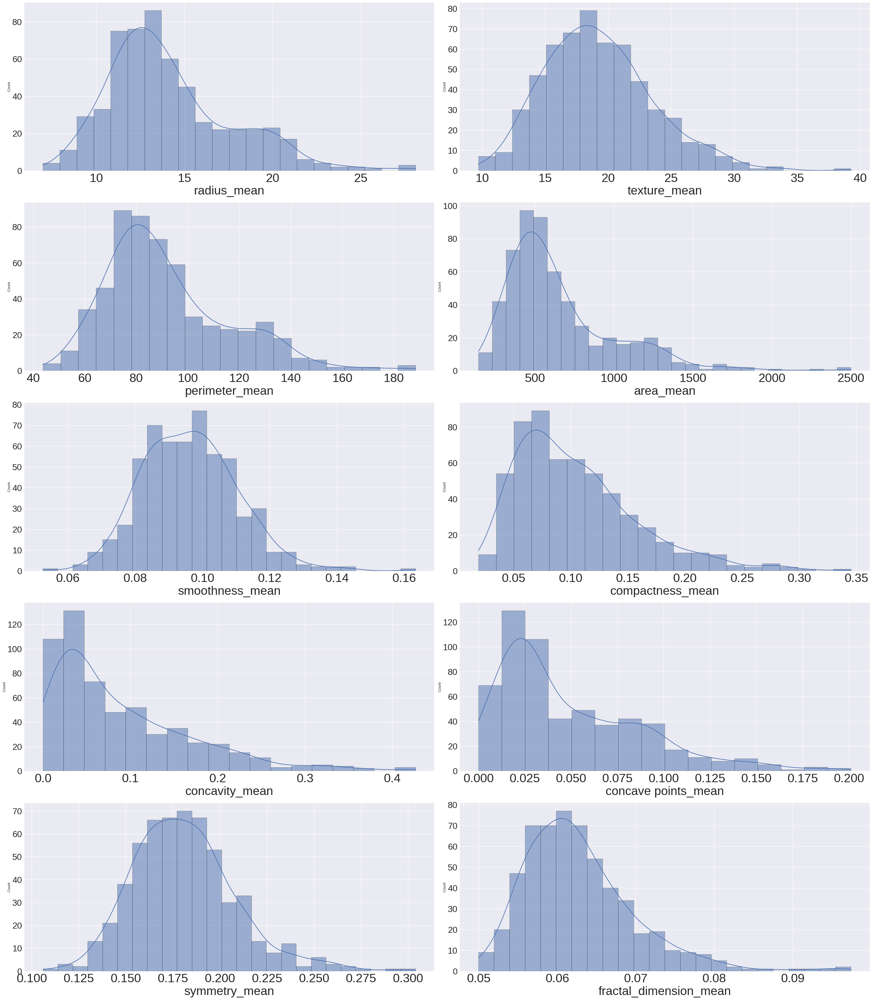

In [ ]:
fig,axs = plt.subplots(ncols =2 ,nrows =5 ,figsize = (35,40),dpi= 100)
axs = axs.flatten()
for i,col in enumerate(df_viz1.drop(columns = 'diagnosis').columns) :
    sns.histplot(x = col,data = df_viz1 ,kde=True, ax=axs[i])
    axs[i].set_xlabel(col,fontsize=35)
    axs[i].tick_params(axis= 'x',labelsize = 35)
    axs[i].tick_params(axis= 'y',labelsize = 25)

plt.tight_layout()
plt.show()

# Analyis on the second part

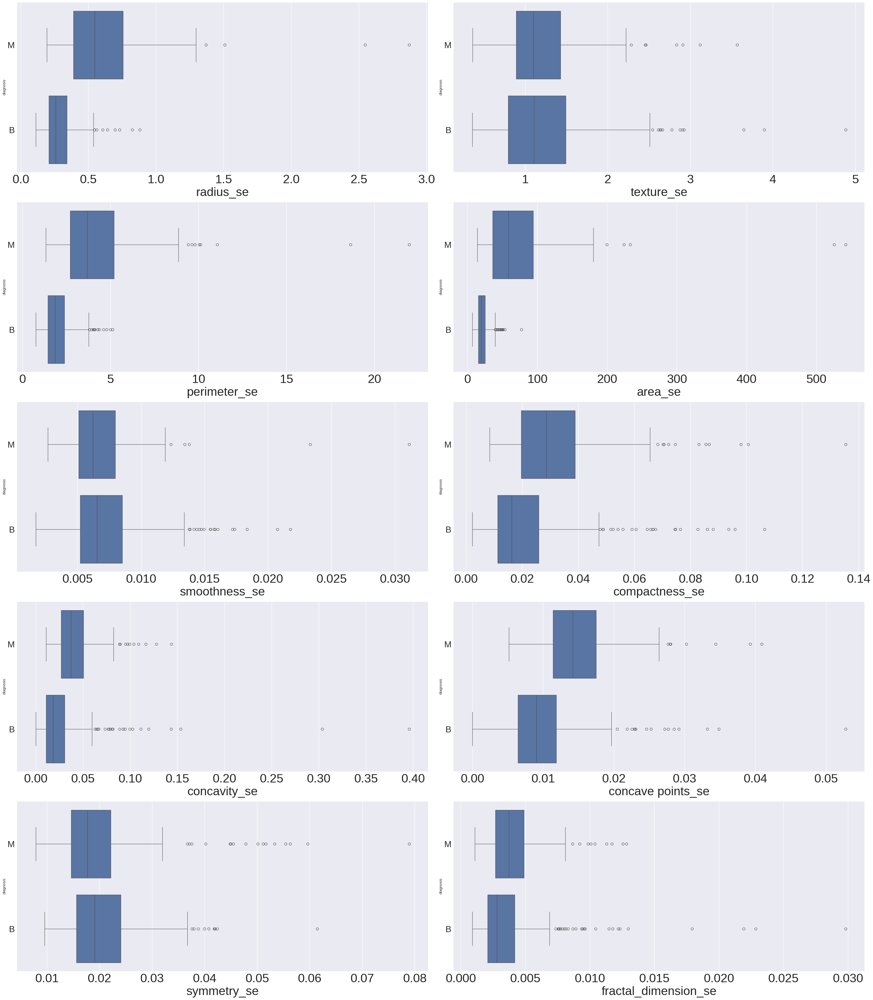

In [ ]:
fig,axs = plt.subplots(ncols =2 ,nrows =5 ,figsize = (35,40),dpi= 100)
axs = axs.flatten()
for i,col in enumerate(df_viz2.drop(columns = 'diagnosis').columns) :
    sns.boxplot(x = col,y='diagnosis',data = df_viz2 , ax=axs[i])
    axs[i].set_xlabel(col,fontsize=35)
    axs[i].tick_params(axis= 'x',labelsize = 35)
    axs[i].tick_params(axis= 'y',labelsize = 25)

plt.tight_layout()
plt.show()

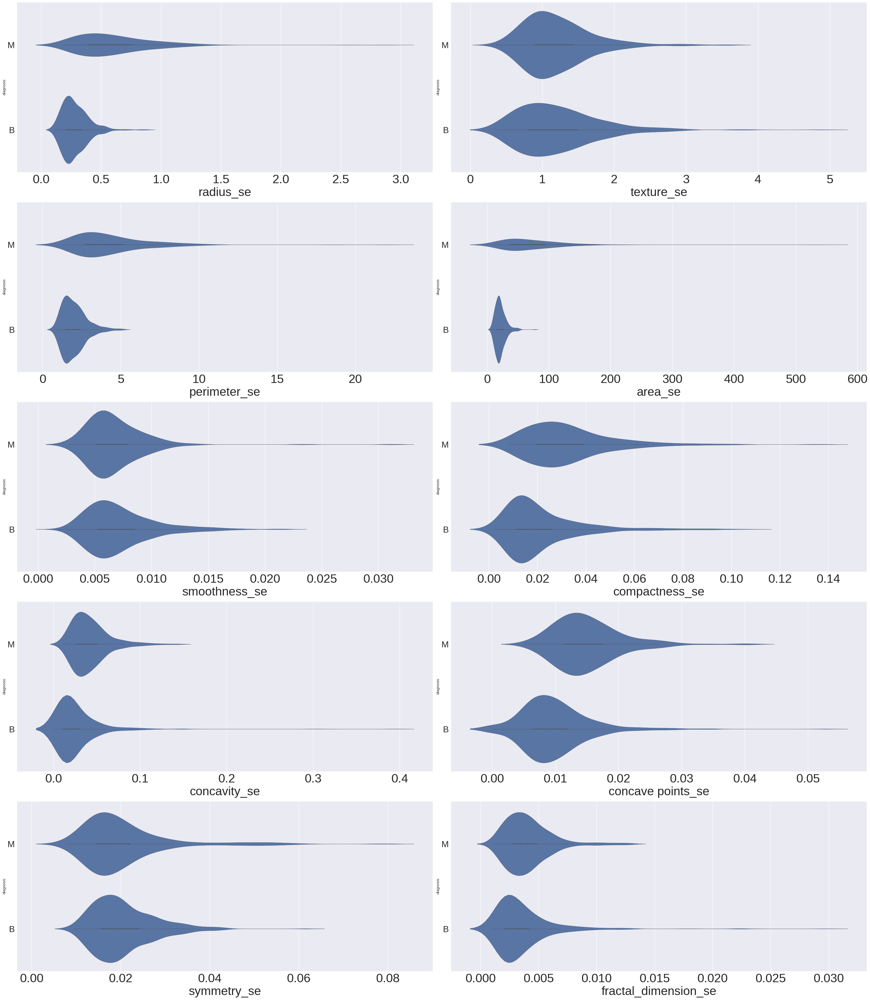

In [ ]:
fig,axs = plt.subplots(ncols =2 ,nrows =5 ,figsize = (35,40),dpi= 100)
axs = axs.flatten()
for i,col in enumerate(df_viz2.drop(columns = 'diagnosis').columns) :
    sns.violinplot(x = col,y='diagnosis',data = df_viz2, ax=axs[i])
    axs[i].set_xlabel(col,fontsize=35)
    axs[i].tick_params(axis= 'x',labelsize = 35)
    axs[i].tick_params(axis= 'y',labelsize = 25)

plt.tight_layout()
plt.show()

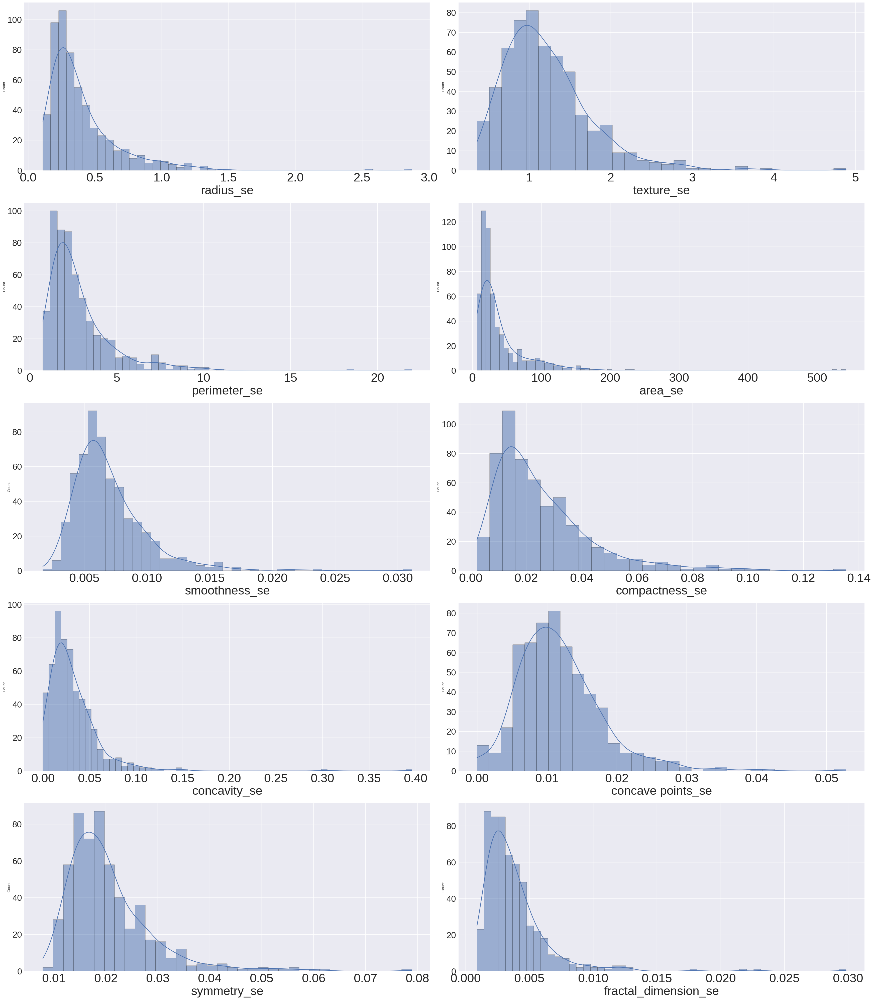

In [ ]:
fig,axs = plt.subplots(ncols =2 ,nrows =5 ,figsize = (35,40),dpi= 100)
axs = axs.flatten()
for i,col in enumerate(df_viz2.drop(columns = 'diagnosis').columns) :
    sns.histplot(x = col,data = df_viz2,kde=True, ax=axs[i])
    axs[i].set_xlabel(col,fontsize=35)
    axs[i].tick_params(axis= 'x',labelsize = 35)
    axs[i].tick_params(axis= 'y',labelsize = 25)

plt.tight_layout()
plt.show()

# Analyis on the third part

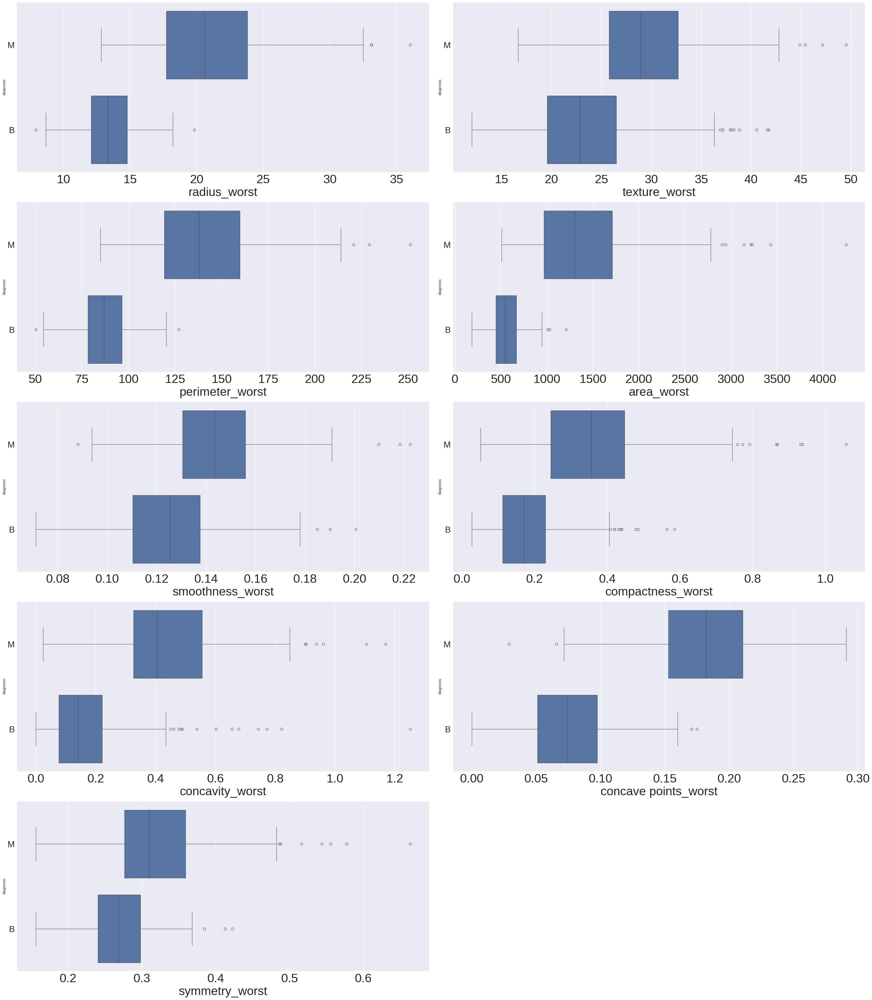

In [ ]:
fig,axs = plt.subplots(ncols =2 ,nrows =5 ,figsize = (35,40),dpi= 100)
axs = axs.flatten()
for i,col in enumerate(df_viz3.drop(columns = 'diagnosis').columns) :
    sns.boxplot(x = col,y='diagnosis',data = df_viz3, ax=axs[i])
    axs[i].set_xlabel(col,fontsize=35)
    axs[i].tick_params(axis= 'x',labelsize = 35)
    axs[i].tick_params(axis= 'y',labelsize = 25)

axs[-1].set_visible(False)
plt.tight_layout()
plt.show()

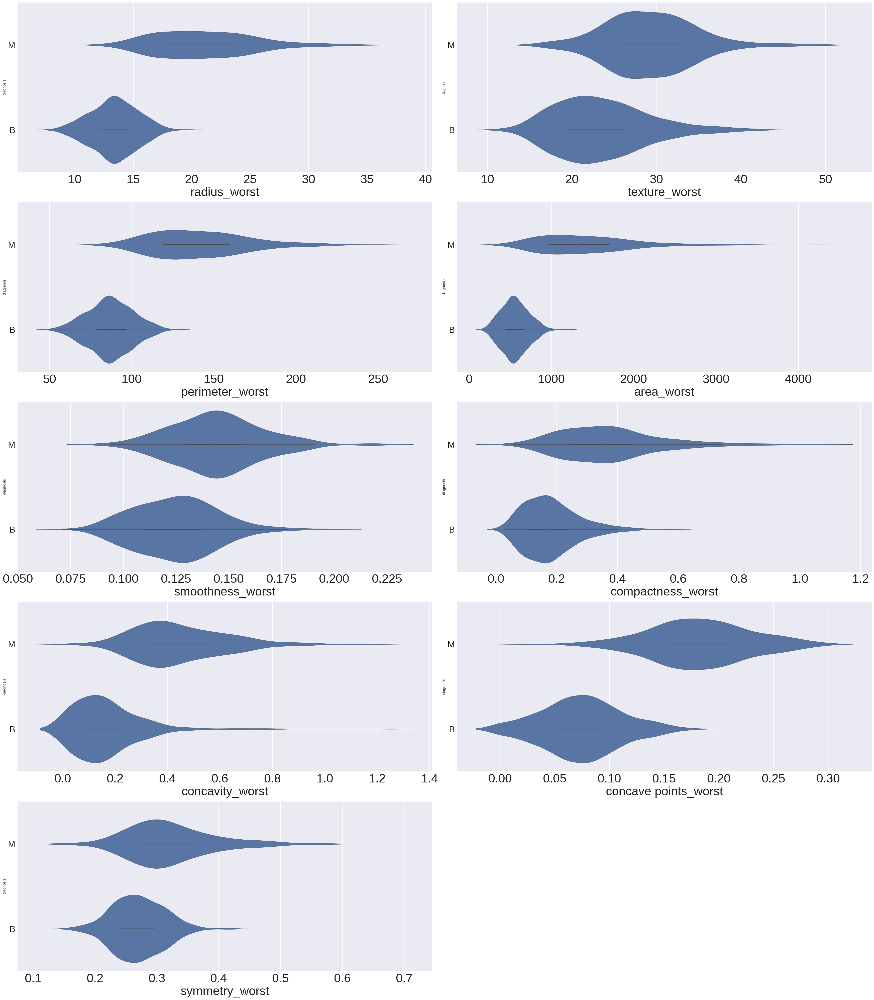

In [ ]:
fig,axs = plt.subplots(ncols =2 ,nrows =5 ,figsize = (35,40),dpi= 100)
axs = axs.flatten()
for i,col in enumerate(df_viz3.drop(columns = 'diagnosis').columns) :
    sns.violinplot(x = col,y='diagnosis',data = df_viz3, ax=axs[i])
    axs[i].set_xlabel(col,fontsize=35)
    axs[i].tick_params(axis= 'x',labelsize = 35)
    axs[i].tick_params(axis= 'y',labelsize = 25)

axs[-1].set_visible(False)
plt.tight_layout()
plt.show()

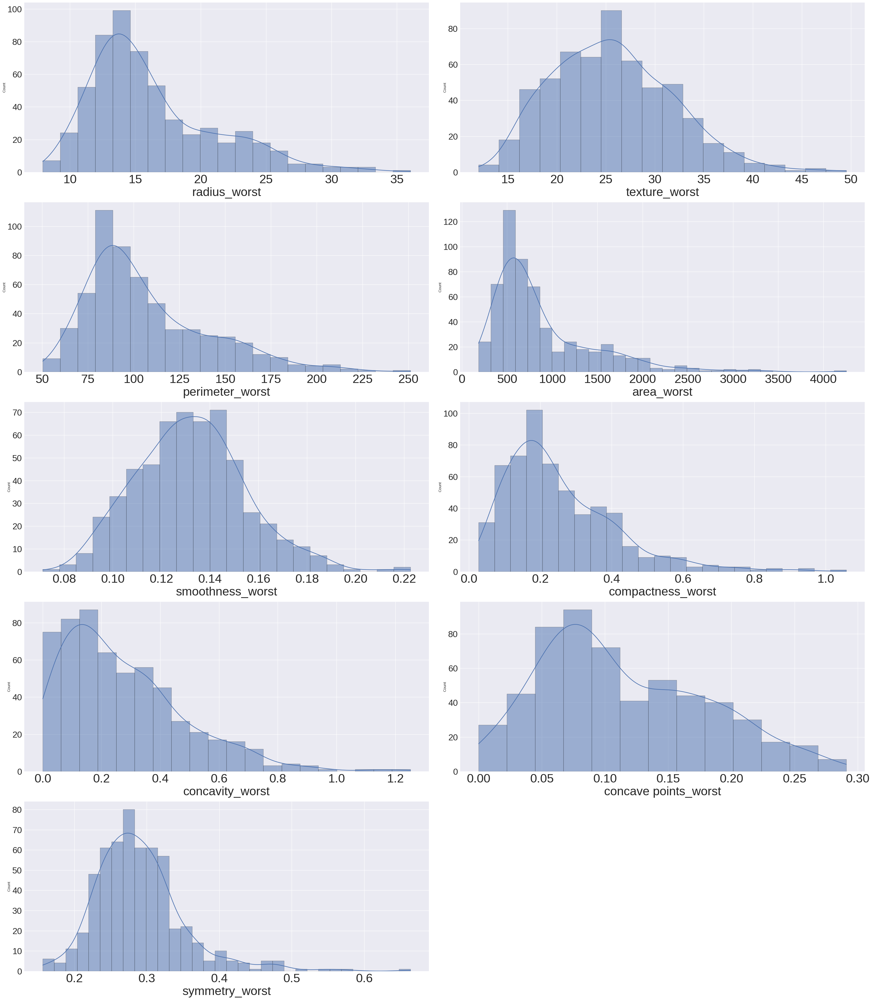

In [ ]:
fig,axs = plt.subplots(ncols =2 ,nrows =5 ,figsize = (35,40),dpi= 100)
axs = axs.flatten()
for i,col in enumerate(df_viz3.drop(columns = 'diagnosis').columns) :
    sns.histplot(x = col,data = df_viz3,kde=True, ax=axs[i])
    axs[i].set_xlabel(col,fontsize=35)
    axs[i].tick_params(axis= 'x',labelsize = 35)
    axs[i].tick_params(axis= 'y',labelsize = 25)

axs[-1].set_visible(False)
plt.tight_layout()
plt.show()

In [ ]:
#map function, convering in numerical values
df['diagnosis'] = df['diagnosis'].map({'M' : 1 , 'B' : 0})
df

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744,0.4956,1.1560,3.445,27.23,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,1,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,0.05623,1.1760,1.2560,7.673,158.70,0.010300,0.02891,0.05198,0.02454,0.01114,0.004239,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,1,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,0.05533,0.7655,2.4630,5.203,99.04,0.005769,0.02423,0.03950,0.01678,0.01898,0.002498,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,1,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,0.05648,0.4564,1.0750,3.425,48.55,0.005903,0.03731,0.04730,0.01557,0.01318,0.003892,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,1,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,0.07016,0.7260,1.5950,5.772,86.22,0.006522,0.06158,0.07117,0.01664,0.02324,0.006185,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


# Correlation Analysis

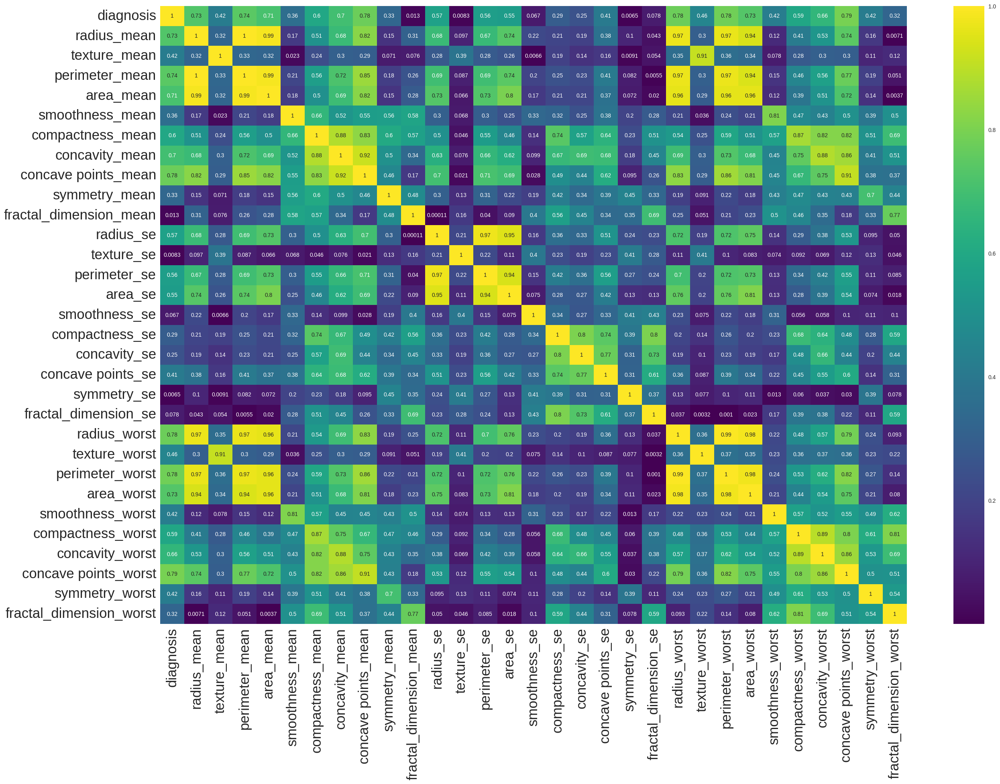

In [ ]:
plt.figure(figsize=(30,20))
sns.heatmap(df.corr().abs(), cmap='viridis', annot=True)
plt.xticks(fontsize=25,rotation=90)
plt.yticks(fontsize=25,rotation=0)
plt.show()

# Categotical Target analysis

diagnosis
0    357
1    212
Name: count, dtype: int64

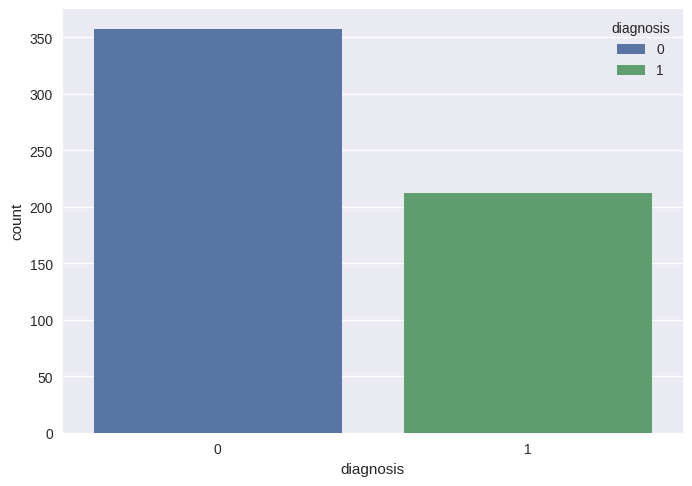

In [ ]:
sns.countplot(x='diagnosis',hue='diagnosis',data = df)
df['diagnosis'].value_counts()

# Analysis Explanation before getting to Making Models
**Based on the analysis above we can see that :**

> The data is allready preprocessed

> all the features are continous but the target is discrete(so we can use classificaion algorithms and for naive bayes we can use gaussian)

>all the distributions are normal

> there are no null values that explains the data being preprocessed before

> there are many features but the data samples are low so it gets harder to work on

> the target is unbalanced but we can see that the higher the values the more the chance of cancer type being "MALIGNANT"

> the correlation between most features is high

# Removing Outliers

In [ ]:
# Compute the mean & std.deviation of each feature
mean = df.mean()
std = df.std()

# Compute the Z-score for each observation
z = (df - mean) / std

In [ ]:
z

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,1.296535,1.096100,-2.071512,1.268817,0.983510,1.567087,3.280628,2.650542,2.530249,2.215566,2.253764,2.487545,-0.564768,2.830540,2.485391,-0.213814,1.315704,0.723390,0.660239,1.147747,0.906286,1.885031,-1.358098,2.301575,1.999478,1.306537,2.614365,2.107672,2.294058,2.748204,1.935312
1,1.296535,1.828212,-0.353322,1.684473,1.907030,-0.826235,-0.486643,-0.023825,0.547662,0.001391,-0.867889,0.498816,-0.875473,0.263095,0.741749,-0.604819,-0.692317,-0.440393,0.259933,-0.804742,-0.099356,1.804340,-0.368879,1.533776,1.888827,-0.375282,-0.430066,-0.146620,1.086129,-0.243675,0.280943
2,1.296535,1.578499,0.455786,1.565126,1.557513,0.941382,1.052000,1.362280,2.035440,0.938859,-0.397658,1.227596,-0.779398,0.850180,1.180298,-0.296744,0.814257,0.212889,1.423575,0.236827,0.293301,1.510541,-0.023953,1.346291,1.455004,0.526944,1.081980,0.854222,1.953282,1.151242,0.201214
3,1.296535,-0.768233,0.253509,-0.592166,-0.763792,3.280667,3.399917,1.914213,1.450431,2.864862,4.906602,0.326087,-0.110312,0.286341,-0.288125,0.689095,2.741868,0.818798,1.114027,4.728520,2.045711,-0.281217,0.133866,-0.249720,-0.549538,3.391291,3.889975,1.987839,2.173873,6.040726,4.930672
4,1.296535,1.748758,-1.150804,1.775011,1.824624,0.280125,0.538866,1.369806,1.427237,-0.009552,-0.561956,1.269426,-0.789549,1.272070,1.189310,1.481763,-0.048477,0.827742,1.143199,-0.360775,0.498889,1.297434,-1.465481,1.337363,1.219651,0.220362,-0.313119,0.612640,0.728618,-0.867590,-0.396751
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,1.296535,2.109139,0.720838,2.058974,2.341795,1.040926,0.218868,1.945573,2.318924,-0.312314,-0.930209,2.779634,0.070963,2.377491,2.601897,1.085429,0.191637,0.665416,2.065360,-1.137415,0.167832,1.899514,0.117596,1.751022,2.013529,0.378033,-0.273077,0.663928,1.627719,-1.358963,-0.708467
565,1.296535,1.703356,2.083301,1.614511,1.722326,0.102368,-0.017817,0.692434,1.262558,-0.217473,-1.057681,1.299356,2.258951,1.155840,1.290429,-0.423637,-0.069697,0.251980,0.807720,-0.188995,-0.490124,1.535369,2.045599,1.420690,1.493644,-0.690623,-0.394473,0.236365,0.733182,-0.531387,-0.973122
566,1.296535,0.701667,2.043775,0.672084,0.577445,-0.839745,-0.038646,0.046547,0.105684,-0.808406,-0.894800,0.184730,-0.257145,0.276450,0.180539,-0.379008,0.660696,0.510377,0.611619,-0.890632,0.036694,0.560868,1.373645,0.578492,0.427529,-0.808876,0.350427,0.326479,0.413705,-1.103578,-0.318129
567,1.296535,1.836725,2.334403,1.980781,1.733693,1.524426,3.269267,3.294046,2.656528,2.135315,1.042778,1.156917,0.685485,1.437265,1.008615,-0.172848,2.015943,1.301140,0.785031,0.326346,0.903262,1.959515,2.235958,2.301575,1.651717,1.429169,3.901415,3.194794,2.287972,1.917396,2.217684


Removing observations with Z-scores beyond a certain threshold

In [ ]:
# Set a threshold for the Z-score
threshold = 3

# Remove observations with Z-scores beyond the threshold
df_without_outliers = df[(np.abs(z) < threshold)]

Visualize the results

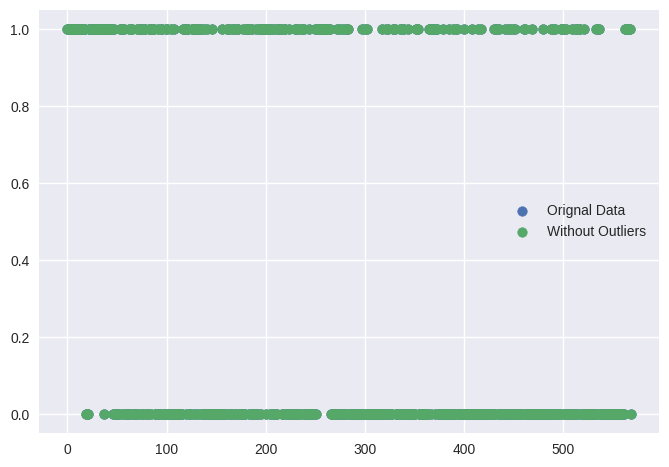

In [ ]:
# Plot the orignal data & the data without outliers
plt.scatter(df.index, df['diagnosis'], label='Orignal Data')
plt.scatter(df_without_outliers.index, df_without_outliers['diagnosis'], label='Without Outliers')

# Add a legend & display the plot
plt.legend()
plt.show()

In [ ]:
df = df_without_outliers
df.isnull().sum()

diagnosis                   0
radius_mean                 5
texture_mean                4
perimeter_mean              7
area_mean                   8
smoothness_mean             5
compactness_mean            9
concavity_mean              9
concave points_mean         6
symmetry_mean               5
fractal_dimension_mean      7
radius_se                   7
texture_se                  9
perimeter_se                8
area_se                     6
smoothness_se               7
compactness_se             12
concavity_se                6
concave points_se           6
symmetry_se                11
fractal_dimension_se       10
radius_worst                6
texture_worst               4
perimeter_worst             6
area_worst                 10
smoothness_worst            3
compactness_worst          10
concavity_worst             7
concave points_worst        0
symmetry_worst              9
fractal_dimension_worst     9
dtype: int64

In [ ]:
# Replacing zero values with NaN
df[["radius_mean", "texture_mean", "perimeter_mean",	"area_mean",	"smoothness_mean",	"compactness_mean",	"concavity_mean",	"concave points_mean",	"symmetry_mean",	"fractal_dimension_mean",	"radius_se",	"texture_se",	"perimeter_se",	"area_se",	"smoothness_se",	"compactness_se",	"concavity_se",	"concave points_se",	"symmetry_se",	"fractal_dimension_se",	"radius_worst",	"texture_worst", "perimeter_worst",	"area_worst",	"smoothness_worst",	"compactness_worst",	"concavity_worst",	"symmetry_worst",	"fractal_dimension_worst"]] = df[["radius_mean", "texture_mean", "perimeter_mean",	"area_mean",	"smoothness_mean",	"compactness_mean",	"concavity_mean",	"concave points_mean",	"symmetry_mean",	"fractal_dimension_mean",	"radius_se",	"texture_se",	"perimeter_se",	"area_se",	"smoothness_se",	"compactness_se",	"concavity_se",	"concave points_se",	"symmetry_se",	"fractal_dimension_se",	"radius_worst",	"texture_worst", "perimeter_worst",	"area_worst",	"smoothness_worst",	"compactness_worst",	"concavity_worst", "symmetry_worst",	"fractal_dimension_worst"]].replace(0, np.NaN)

In [ ]:
df.skew()

diagnosis                  0.528461
radius_mean                0.732608
texture_mean               0.415543
perimeter_mean             0.719688
area_mean                  1.123031
smoothness_mean            0.222194
compactness_mean           0.839790
concavity_mean             1.084162
concave points_mean        0.992385
symmetry_mean              0.437001
fractal_dimension_mean     0.724910
radius_se                  1.497162
texture_se                 0.808403
perimeter_se               1.626491
area_se                    1.919437
smoothness_se              1.104517
compactness_se             1.195501
concavity_se               1.338810
concave points_se          0.847299
symmetry_se                1.136303
fractal_dimension_se       1.457487
radius_worst               0.928728
texture_worst              0.311596
perimeter_worst            0.942354
area_worst                 1.310363
smoothness_worst           0.221021
compactness_worst          0.930322
concavity_worst            0

In [ ]:
# Replacing NaN with Mean values
df["radius_mean"].fillna(df["radius_mean"].mean(), inplace = True)
df["texture_mean"].fillna(df["texture_mean"].mean(), inplace = True)
df["perimeter_mean"].fillna(df["perimeter_mean"].mean(), inplace = True)
df["area_mean"].fillna(df["area_mean"].mean(), inplace = True)
df["smoothness_mean"].fillna(df["smoothness_mean"].mean(), inplace = True)
df["compactness_mean"].fillna(df["compactness_mean"].mean(), inplace = True)
df["concavity_mean"].fillna(df["concavity_mean"].mean(), inplace = True)
df["concave points_mean"].fillna(df["concave points_mean"].mean(), inplace = True)
df["symmetry_mean"].fillna(df["symmetry_mean"].mean(), inplace = True)
df["fractal_dimension_mean"].fillna(df["fractal_dimension_mean"].mean(), inplace = True)

df["radius_se"].fillna(df["radius_se"].mean(), inplace = True)
df["texture_se"].fillna(df["texture_se"].mean(), inplace = True)
df["perimeter_se"].fillna(df["perimeter_se"].mean(), inplace = True)
df["area_se"].fillna(df["area_mean"].mean(), inplace = True)
df["smoothness_se"].fillna(df["smoothness_se"].mean(), inplace = True)
df["compactness_se"].fillna(df["compactness_se"].mean(), inplace = True)
df["concavity_se"].fillna(df["concavity_se"].mean(), inplace = True)
df["concave points_se"].fillna(df["concave points_se"].mean(), inplace = True)
df["symmetry_se"].fillna(df["symmetry_se"].mean(), inplace = True)
df["fractal_dimension_se"].fillna(df["fractal_dimension_se"].mean(), inplace = True)

df["radius_worst"].fillna(df["radius_worst"].mean(), inplace = True)
df["texture_worst"].fillna(df["texture_worst"].mean(), inplace = True)
df["perimeter_worst"].fillna(df["perimeter_worst"].mean(), inplace = True)
df["area_worst"].fillna(df["area_worst"].mean(), inplace = True)
df["smoothness_worst"].fillna(df["smoothness_worst"].mean(), inplace = True)
df["compactness_worst"].fillna(df["compactness_worst"].mean(), inplace = True)
df["concavity_worst"].fillna(df["concavity_worst"].mean(), inplace = True)
df["symmetry_worst"].fillna(df["symmetry_worst"].mean(), inplace = True)
df["fractal_dimension_worst"].fillna(df["fractal_dimension_worst"].mean(), inplace = True)

# standardizing Data

In [ ]:
scaler = preprocessing.StandardScaler()
X = df.drop(columns = 'diagnosis').values
X = scaler.fit_transform(X)
Y = df['diagnosis'].values.reshape(-1,1)

x_train,x_test,y_train,y_test = train_test_split(X,Y,test_size=0.2,random_state=42)

# Roc , Auc and f1 score comparison


> **I do this to realize which models do better with their default values so I can decide which model to use**

In [ ]:
from sklearn.metrics import roc_curve, auc
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
from sklearn.ensemble import AdaBoostClassifier

In [ ]:
models = [LogisticRegression(random_state=42),KNeighborsClassifier(),
          SVC(probability=True, random_state=42),GaussianNB(),
          DecisionTreeClassifier(random_state=42),RandomForestClassifier(random_state=42),xgb.XGBClassifier(),AdaBoostClassifier()]
model_names = ['LogisticRegression','KNN','SVM','NaiveBayes','DecisionTree','RandomForest','XGBoost','AdaBoostClassifier']
auc_scores = []


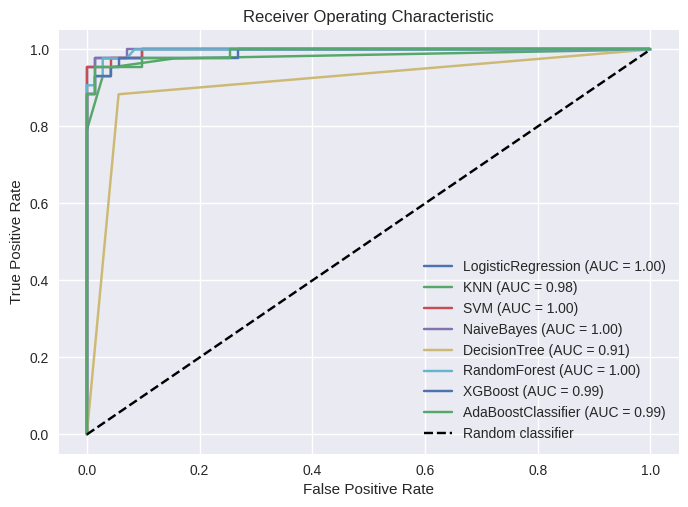

In [ ]:
for model,name in zip(models,model_names):
    model.fit(x_train,y_train)
    y_pred_prob = model.predict_proba(x_test)[:, 1]
    fpr,tpr,thresholds = roc_curve(y_test,y_pred_prob)
    auc_score = auc(fpr,tpr)
    auc_scores.append(auc_score)
    plt.plot(fpr, tpr, label='%s (AUC = %0.2f)' % (name, auc_score))

plt.plot([0, 1], [0, 1], 'k--', label='Random classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()

In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score
f1_scores = []
recall = []
precision = []

for model, name in zip(models, model_names):
    model.fit(x_train, y_train)
    y_pred = model.predict(x_test)
    f1 = f1_score(y_test, y_pred)
    r = recall_score(y_test,y_pred)
    p = precision_score(y_test,y_pred)
    f1_scores.append(f1)
    recall.append(r)
    precision.append(p)
    print('%s: F1-score = %0.3f' % (name, f1))
    print('%s: Precision = %0.3f' % (name, p))
    print('%s: Recall = %0.3f' % (name, r))
    print('\n')




average_f1_score = sum(f1_scores) / len(f1_scores)
print('Average F1-score:', average_f1_score)

LogisticRegression: F1-score = 0.977
LogisticRegression: Precision = 0.977
LogisticRegression: Recall = 0.977


KNN: F1-score = 0.930
KNN: Precision = 0.930
KNN: Recall = 0.930


SVM: F1-score = 0.953
SVM: Precision = 0.953
SVM: Recall = 0.953


NaiveBayes: F1-score = 0.952
NaiveBayes: Precision = 0.976
NaiveBayes: Recall = 0.930


DecisionTree: F1-score = 0.894
DecisionTree: Precision = 0.905
DecisionTree: Recall = 0.884


RandomForest: F1-score = 0.941
RandomForest: Precision = 0.952
RandomForest: Recall = 0.930


XGBoost: F1-score = 0.941
XGBoost: Precision = 0.952
XGBoost: Recall = 0.930


AdaBoostClassifier: F1-score = 0.953
AdaBoostClassifier: Precision = 0.953
AdaBoostClassifier: Recall = 0.953


Average F1-score: 0.9428506286235425


> We can see that Logistic Regression , SVM and AdaBoost have the best scores so we continue to make models based on this information

# Making Models

In [ ]:
from sklearn.model_selection import GridSearchCV

SVM = SVC()

C = [0.1,1,10,100]
kernel = ['linear', 'poly', 'rbf', 'sigmoid']

params = {'C':C,'kernel':kernel}

SVM_grid = GridSearchCV(estimator = SVM,param_grid = params,refit= True,verbose = 0,n_jobs=-1)
SVM_grid.fit(x_train,y_train.ravel())
print(f"best parameters : {SVM_grid.best_params_}")
print(f"best score : {SVM_grid.best_score_}")

best parameters : {'C': 0.1, 'kernel': 'linear'}
best score : 0.9758241758241759


In [ ]:
LogReg = LogisticRegression(max_iter=10000)

penalty = ['l1','l2','elasticnet']
solver = [ 'newton-cg', 'lbfgs', 'liblinear', 'sag','saga']
C = [0.001, 0.01, 0.1, 1, 10, 100]

params2 = {'C' : C ,'penalty' : penalty , 'solver' : solver }


LogReg_grid = GridSearchCV(estimator = LogReg,param_grid = params2 ,refit= True,verbose = 0,n_jobs=-1)
LogReg_grid.fit(x_train,y_train.ravel())
print(f"best parameters : {LogReg_grid.best_params_}")
print(f"best score : {LogReg_grid.best_score_}")

best parameters : {'C': 1, 'penalty': 'l2', 'solver': 'liblinear'}
best score : 0.9780219780219781


In [ ]:
AdaBoost = AdaBoostClassifier()

estimator = [DecisionTreeClassifier(), SVC(), LogisticRegression(), GaussianNB(), KNeighborsClassifier()]
n_estimators = range(50,500,50)
learning_rate = np.arange(0.1, 1.1, 0.1)
algorithm = ['SAMME','SAMME.R']

params3 = {'estimator': estimator , 'n_estimators' : n_estimators , 'learning_rate' : learning_rate  ,'algorithm' : algorithm }

AdaBoostGrid = GridSearchCV(estimator=AdaBoost , param_grid=params3 , refit= True,verbose = 0,n_jobs=-1 )
AdaBoostGrid.fit(x_train,y_train.ravel())
print(f"best parameters : {AdaBoostGrid.best_params_}")
print(f"best score : {AdaBoostGrid.best_score_}")


best parameters : {'algorithm': 'SAMME.R', 'estimator': LogisticRegression(), 'learning_rate': 0.1, 'n_estimators': 100}
best score : 0.9736263736263737


# The final Model

> As we can see Logistic Regression was the best and most efficient model so we use it as the final model

accuracy  : 0.9824561403508771 

f1 score  : 0.9767441860465116 

classification report :
               precision    recall  f1-score   support

           0       0.99      0.99      0.99        71
           1       0.98      0.98      0.98        43

    accuracy                           0.98       114
   macro avg       0.98      0.98      0.98       114
weighted avg       0.98      0.98      0.98       114
 

The Confusion Matrix : 



<Axes: >

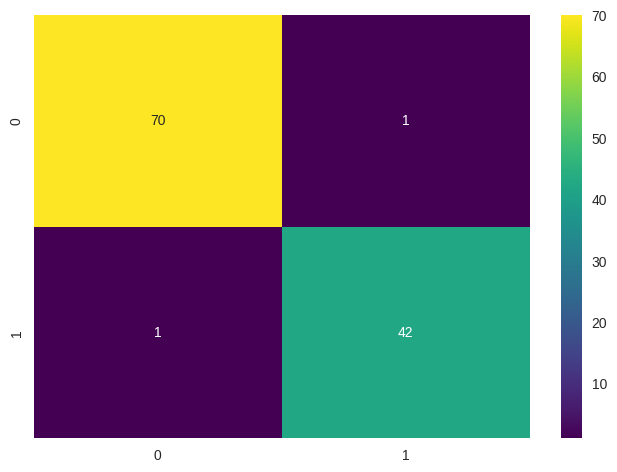

In [ ]:
LogReg = LogisticRegression(solver='liblinear' , C = 0.1 , penalty = 'l2')
LogReg.fit(x_train,y_train.ravel())
y_pred = LogReg.predict(x_test)

print(f"accuracy  : {accuracy_score(y_test,y_pred)} \n")
print(f"f1 score  : {f1_score(y_test,y_pred)} \n")
print(f"classification report :\n {classification_report(y_test,y_pred)} \n")

print('The Confusion Matrix : \n')
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, cmap='viridis', annot=True)

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=d4a047f5-1bc6-48c5-9ac0-bc6bd0a751df' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>